### Logistic Regression with Scikit Learn - Machine Learning with Python


The following topics are covered in this tutorial:

- Downloading a real-world dataset from Kaggle
- Exploratory data analysis and visualization
- Splitting a dataset into training, validation & test sets
- Filling/imputing missing values in numeric columns
- Scaling numeric features to a $(0,1)$ range
- Encoding categorical columns as one-hot vectors
- Training a logistic regression model using Scikit-learn
- Evaluating a model using a validation set and test set


### Business Problem ( Ask of the task )

The Rain in Australia dataset contains 10 years of weather data that is recorded daily from different weather stations. The same of the data set
![](https://i.imgur.com/5QNJvir.png)
>
> As a data scientist at the Bureau of Meteorology, we are tasked with creating a fully-automated system that can  weather data for a given location to predict whether it will rain at the location tomorrow. 
>
>
> ![](https://i.imgur.com/KWfcpcO.png)
> Identify the features that can predict the weather forecast,
> Plot the charts to find the relationship between independent variables

### Logistic Regression for Solving Classification Problems

Logistic regression is a commonly used technique for solving binary classification problems. In a logistic regression model: 

- we take linear combination (or weighted sum of the input features) 
- we apply the sigmoid function to the result to obtain a number between 0 and 1
- this number represents the probability of the input being classified as "Yes"
- instead of RMSE, the cross entropy loss function is used to evaluate the results


Here's a visual summary of how a logistic regression model is structured ([source](http://datahacker.rs/005-pytorch-logistic-regression-in-pytorch/)):


<img src="https://i.imgur.com/YMaMo5D.png" width="480">

The sigmoid function applied to the linear combination of inputs has the following formula:

<img src="https://i.imgur.com/sAVwvZP.png" width="400">


The output of the sigmoid function is called a logistic, hence the name _logistic regression_. For a mathematical discussion of logistic regression, sigmoid activation and cross entropy, check out [this YouTube playlist](https://www.youtube.com/watch?v=-la3q9d7AKQ&list=PLNeKWBMsAzboR8vvhnlanxCNr2V7ITuxy&index=1). Logistic regression can also be applied to multi-class classification problems, with a few modifications.

### Machine learning flowchart 
Whether we're solving a regression problem using linear regression or a classification problem using logistic regression, the workflow for training a model is exactly the same:

1. We initialize a model with random parameters (weights & biases).
2. We pass some inputs into the model to obtain predictions.
3. We compare the model's predictions with the actual targets using the loss function.  
4. We use an optimization technique (like least squares, gradient descent etc.) to reduce the loss by adjusting the weights & biases of the model
5. We repeat steps 1 to 4 till the predictions from the model are good enough.


<img src="https://www.deepnetts.com/blog/wp-content/uploads/2019/02/SupervisedLearning.png" width="480">


Classification and regression are both supervised machine learning problems, because they use labeled data. Machine learning applied to unlabeled data is known as unsupervised learning ([image source](https://au.mathworks.com/help/stats/machine-learning-in-matlab.html)). 

<img src="https://i.imgur.com/1EMQmAw.png" width="480">


In this tutorial, we'll train a _logistic regression_ model using the Rain in Australia dataset to predict whether or not it will rain at a location tomorrow, using today's data. This is a _binary classification_ problem.

Let's install the `scikit-learn` library which we'll use to train our model.


### Data download and preprocessing variables for model creation

In [1]:
# we will use the kaggle data set from kaggle directly for that we need to install opendatasets in Juypiter
!pip install opendatasets --upgrade --quiet

In [2]:
import opendatasets as od

In [3]:
od.version()

'0.1.20'

In [4]:
# Dataset can be downloaded using od. download command for this we need to provide the kaggle username and API key.
url_kaggle= 'https://www.kaggle.com/jsphyg/weather-dataset-rattle-package'

In [5]:
od.download(url_kaggle)


Skipping, found downloaded files in ".\weather-dataset-rattle-package" (use force=True to force download)


In [6]:
# importing OS library for creating the dir
import os
data_directory='./weather-dataset-rattle-package'

In [7]:
os.listdir(data_directory)

['weatherAUS.csv']

In [8]:
# creating Training data 
train_data=data_directory+'/weatherAUS.csv'

In [9]:
# creating pandas datra frame ( Pandas is used extensively in the following library please refer to pandas library on official website)
import pandas as pd
df=pd.read_csv(train_data)

In [10]:
# After converting it is always good to check the few lines of the table to understand the data type and the flow
df.head(10)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
5,2008-12-06,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,...,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,No
6,2008-12-07,Albury,14.3,25.0,0.0,NaN,NaN,W,50.0,SW,...,49.0,19.0,1009.6,1008.2,1.0,NaN,18.1,24.6,No,No
7,2008-12-08,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,...,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,No
8,2008-12-09,Albury,9.7,31.9,0.0,NaN,NaN,NNW,80.0,SE,...,42.0,9.0,1008.9,1003.6,NaN,NaN,18.3,30.2,No,Yes
9,2008-12-10,Albury,13.1,30.1,1.4,NaN,NaN,W,28.0,S,...,58.0,27.0,1007.0,1005.7,NaN,NaN,20.1,28.2,Yes,No


In [108]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

Clearly we can see that sum columns have missing information and also some might not be relevant for our model.

Effective way of apporaching any problem is to first understand the data from analyst perspective

In [11]:
# we can use info command to understand the data in nutshell
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

#### Quick observation

1. We can see there are missing observation for multiple columns , the total observation points is 145460 
2. We are going to predict Rain tomorrow and it has some missing values which we need to fix later in the code flow


### Clean the columns with missing value

We can create a subset of dataframe where we have missing values for Rain today and tomorrow as we cannot fix those columns , for other columns with numeric data there are steps we can follow either taking mean,median and mode or we can replace those columns with assumptions.

In [12]:
df.dropna(subset=['RainToday','RainTomorrow'],inplace=True)

### Data visualization ( EDA)

Famous python libraries for visualization are seaborn and matplotlib and plotly ,I have already installed all of them 

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np
% %matplotlib inline
sns.set_style('darkgrid')
matplotlib.rcParams['fontsize']=13

UsageError: Line magic function `%` not found.


In [107]:
px.histogram(df,x='Location',title='Location vs. Rainy Days', color='RainToday')


1. Certain location measurment are not high , we can ignore those locations as for those area's we dont have records from weather indusrty
2. On an average for each loation distribution of rainfall covers 20% of observation , which is a good information to predict red one denotes rain with yes for count of days
3. Overall the trend follows uniform distribution from yes and no for rainfall , which clearly states data is not skewed.
4. Location can be the factor for the correlation with rain today feature ( one of the solution to business question)


We can plot few more graphs of histogram to understand the other features 

In [22]:
px.histogram(df,x='Temp3pm',title='temp at 3 PM vs Rain tomorrow ', color='RainTomorrow')

Summary : Guess from the grahph is temperature at 3PM is low there is an expectation that it will rain tomorrow, this is supported from the graph , although the hypothesis also suggest that in some obsevations that temperature is high still it will rain tomorrow.

- One quick observation we can carry from the chart is lower temperature will forecast rain for tomorrow as per the historical data

In [23]:
px.histogram(df,x='RainTomorrow',color='RainToday',title= 'Rain tomorrow vs Rain today')

This plot will help us understand in how many cases rain tomorrow is set to yes and in how many cases it set to No, The distribution of yes and no can be checked from the above graph , Out of 140000 data points for about 110000 it seems like it didnot rain and for about 30000 data points it did rain on the next day .

This is call class imbalance .

In [24]:
px.scatter(df.sample(2000), title='Minimum Temp. vs Maximum Temp',x='MinTemp',y='MaxTemp', 
           color='RainToday')

Scatterplot of Max tem vs Min temperature , The plot depicts there is a linear relationship between the two features . Where Minimum temperature and Maximum temperature are close rain today seems to be common .

In [26]:
# One last chart to check Humidity vs temperature
px.strip(df.sample(2000),title= 'Temp 3PM vs Humidity(3PM)', x='Temp3pm', y='Humidity3pm', color='RainTomorrow')

Low temperature and high humidity suggest that it will raintomorrow and also it will be true for raint today.

### Training and validation of data set

Building a machine learning model involves splitting your dataset into train, validation and test .

- Train : The data will be used to train the model , higher the training data more observation will be taken into model 
- Validation: To generalize the model well , split data into validation steps, this will be used to evaluate the model during the training 
- Test : Post you run the model on train and validation , you want to predict the unseen data so that we can measure the accuracy of the model , Test data will be used to understand if we are overfitting or underfitting the model.

As a rule of thumb , usually 60-20-20 ratios are taken to split the data 

### Sklearn libraries for running machine learning models

In [28]:
from sklearn.model_selection import train_test_split

### Split Rule

Splitting of train and test data should be done on time , For time series data it is good to split based on weeks or days or month data

In [32]:
# Converting the date to datetime format
yr=pd.to_datetime(df.Date).dt.year

In [38]:
train_data=df[yr<2015]
validation_data=df[yr==2015]
test_data=df[yr>2015]

In [39]:
# Train data 
train_data.head(5)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


### Identify the Target and Independent features

In [36]:
# Creating list of inputs columns excluding year column as we are predicting weather it will rain tomorrow or not
indep_inputs=list(train_data.columns)[1:-1]
target_c='RainTomorrow'

In [41]:
# using target and Inputs columns let us create sets of train, validation and test
train_i=train_data[indep_inputs].copy()
train_t=train_data[target_c].copy()
# Validation set
validation_i=validation_data[indep_inputs].copy()
validation_t=validation_data[target_c].copy()
# test splits
test_i=test_data[indep_inputs].copy()
test_t=test_data[target_c].copy()

In [44]:
# Identifying the numerical and categorical columns to perform the column imputation 
numeric_columns=train_i.select_dtypes(include=np.number).columns.tolist()[:-1]
categorical_cols=train_i.select_dtypes('object').columns.tolist()

In [45]:
train_i[numeric_columns].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am
count,97674.000000,97801.000000,97988.000000,61657.000000,57942.000000,91160.000000,97114.000000,96919.000000,96936.000000,96872.000000,88876.000000,88857.000000,63000.000000,61966.000000,97414.000000
mean,12.007831,23.022202,2.372935,5.289991,7.609004,40.215873,14.092263,18.764608,68.628745,51.469547,1017.513734,1015.132352,4.302952,4.410677,16.835126
std,6.347175,6.984397,8.518819,3.952010,3.788813,13.697967,8.984203,8.872398,19.003097,20.756113,7.072510,6.997072,2.866634,2.693370,6.404586
min,-8.500000,-4.100000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,979.000000,0.000000,0.000000,-5.900000
25%,7.500000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.800000,1010.400000,1.000000,2.000000,12.200000
50%,11.800000,22.400000,0.000000,4.600000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.500000,1015.100000,5.000000,5.000000,16.600000
75%,16.600000,27.900000,0.800000,7.200000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.300000,1019.900000,7.000000,7.000000,21.400000
max,33.900000,48.100000,371.000000,82.400000,14.300000,135.000000,87.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000


we need to impute for numeric columns using the standard scaler technique for the missing data 

In [46]:
# load libraries of imput from sklearn
from sklearn.impute import SimpleImputer

In [47]:
imputer_var=SimpleImputer(strategy='mean')

In [49]:
imputer_var.fit(df[numeric_columns])

SimpleImputer()

Using the imputer_var we will transform train, validation and test sets for adding missing value with mean

In [50]:
train_i[numeric_columns]=imputer_var.transform(train_i[numeric_columns])
validation_i[numeric_columns]=imputer_var.transform(validation_i[numeric_columns])
test_i[numeric_columns]=imputer_var.transform(test_i[numeric_columns])

In [51]:
train_i[numeric_columns].isna().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
dtype: int64

Missing values are sorted for now with the above process

#### One of the next steps in the data preprocessing is to scale the numeric data. Scaling ensures that features are in same magnitude with the rest of the independent features

In [52]:
# To check the range for better understanding if we have to scale or not

df[numeric_columns].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am
count,140319.000000,140480.00000,140787.000000,81093.000000,73982.000000,131682.000000,139732.000000,138256.000000,139270.000000,137286.000000,127044.000000,127018.000000,88162.000000,84693.000000,140131.000000
mean,12.184824,23.23512,2.349974,5.472516,7.630540,39.970520,13.990496,18.631141,68.826833,51.449288,1017.654577,1015.257963,4.431161,4.499250,16.987066
std,6.403879,7.11450,8.465173,4.189132,3.781729,13.578201,8.886210,8.798096,19.063650,20.807310,7.104867,7.035411,2.886594,2.719752,6.496012
min,-8.500000,-4.80000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000
25%,7.600000,17.90000,0.000000,2.600000,4.900000,31.000000,7.000000,13.000000,57.000000,37.000000,1013.000000,1010.400000,1.000000,2.000000,12.300000
50%,12.000000,22.60000,0.000000,4.800000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000
75%,16.800000,28.30000,0.800000,7.400000,10.700000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.400000,1020.000000,7.000000,7.000000,21.600000
max,33.900000,48.10000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000


Min Max and StandardSclaer are the two well known techniques that are used to standardized the numerical columns

In [53]:
from sklearn.preprocessing import MinMaxScaler

In [54]:
scl=MinMaxScaler()

In [55]:
scl.fit(df[numeric_columns])

MinMaxScaler()

Using the above scaler we will transform train, validation and test datasets

In [57]:
train_i[numeric_columns]=scl.transform(train_i[numeric_columns])
validation_i[numeric_columns]=scl.transform(validation_i[numeric_columns])
test_i[numeric_columns]=scl.transform(test_i[numeric_columns])

In [58]:
train_i[numeric_columns].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am
count,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000
mean,0.211879,0.100680,0.000017,0.000255,0.036232,-0.044457,0.000834,0.002479,0.006863,0.005147,-16.196496,-15.623861,0.053688,0.054855,0.162597
std,0.003525,0.002493,0.000062,0.000149,0.013857,0.000794,0.000529,0.001166,0.001890,0.002064,0.001840,0.001706,0.028387,0.026448,0.002842
min,0.200472,0.090987,0.000000,0.000000,0.000000,-0.046512,0.000000,0.000000,0.000000,0.000000,-16.206612,-15.633114,0.000000,0.000000,0.152477
25%,0.209372,0.098849,0.000000,0.000181,0.035672,-0.045009,0.000414,0.001718,0.005700,0.003700,-16.197623,-15.624947,0.037037,0.037037,0.160533
50%,0.211764,0.100457,0.000000,0.000260,0.036293,-0.044529,0.000769,0.002510,0.006900,0.005200,-16.196461,-15.623832,0.054706,0.055546,0.162492
75%,0.214434,0.102422,0.000006,0.000266,0.043757,-0.044108,0.001124,0.003171,0.008300,0.006500,-16.195328,-15.622797,0.074074,0.074074,0.164584
max,0.224057,0.109641,0.002695,0.003919,0.068014,-0.038760,0.005148,0.011494,0.010000,0.010000,-16.190083,-15.617600,0.111111,0.111111,0.172996


ML models can only be run on the numeric data we need to convert categorical data to numeric data

In [59]:
# Importing one hot encoder from sklearn
from sklearn.preprocessing import OneHotEncoder


In [60]:
enocd=OneHotEncoder(sparse=False,handle_unknown='ignore')

In [61]:
enocd.fit(df[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse=False)

In [63]:
encoded_cols=list(enocd.get_feature_names(categorical_cols))

In [64]:
print(encoded_cols)

['Location_Adelaide', 'Location_Albany', 'Location_Albury', 'Location_AliceSprings', 'Location_BadgerysCreek', 'Location_Ballarat', 'Location_Bendigo', 'Location_Brisbane', 'Location_Cairns', 'Location_Canberra', 'Location_Cobar', 'Location_CoffsHarbour', 'Location_Dartmoor', 'Location_Darwin', 'Location_GoldCoast', 'Location_Hobart', 'Location_Katherine', 'Location_Launceston', 'Location_Melbourne', 'Location_MelbourneAirport', 'Location_Mildura', 'Location_Moree', 'Location_MountGambier', 'Location_MountGinini', 'Location_Newcastle', 'Location_Nhil', 'Location_NorahHead', 'Location_NorfolkIsland', 'Location_Nuriootpa', 'Location_PearceRAAF', 'Location_Penrith', 'Location_Perth', 'Location_PerthAirport', 'Location_Portland', 'Location_Richmond', 'Location_Sale', 'Location_SalmonGums', 'Location_Sydney', 'Location_SydneyAirport', 'Location_Townsville', 'Location_Tuggeranong', 'Location_Uluru', 'Location_WaggaWagga', 'Location_Walpole', 'Location_Watsonia', 'Location_Williamtown', 'Loca

In [66]:
train_i[encoded_cols]=enocd.transform(train_i[categorical_cols])
validation_i[encoded_cols]=enocd.transform(validation_i[categorical_cols])
test_i[encoded_cols]=enocd.transform(test_i[categorical_cols])

C:\Users\abhay\anaconda3\lib\site-packages\pandas\core\frame.py:3673: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider using pd.concat instead.  To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\abhay\anaconda3\lib\site-packages\pandas\core\frame.py:3673: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider using pd.concat instead.  To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\abhay\anaconda3\lib\site-packages\pandas\core\frame.py:3673: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider using pd.concat instead.  To get a de-fragmented frame, use `newframe = frame.copy()`



## Training a Logistic Regression Model

Logistic regression is a commonly used technique for solving binary classification problems. In a logistic regression model: 

Here's a visual summary of how a logistic regression model is structured ([source](http://datahacker.rs/005-pytorch-logistic-regression-in-pytorch/)):


<img src="https://i.imgur.com/YMaMo5D.png" width="480">

The sigmoid function applied to the linear combination of inputs has the following formula:

<img src="https://i.imgur.com/sAVwvZP.png" width="400">

To train a logistic regression model, we can use the `LogisticRegression` class from Scikit-learn.

In [68]:
# from sklearn import logistic regression
from sklearn.linear_model import LogisticRegression

In [69]:
model_d=LogisticRegression(solver='liblinear')

In [70]:
model_d.fit(train_i[numeric_columns+encoded_cols],train_t)

LogisticRegression(solver='liblinear')

### Making Predictions and Evaluatiing the Model

In [95]:
train_pred=train_i[numeric_columns+encoded_cols]
val_pred=validation_i[numeric_columns+encoded_cols]
test_pred=test_i[numeric_columns+encoded_cols]

In [96]:
prediction_train=model_d.predict(train_pred)

In [97]:
test_pred

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,WindDir3pm_nan,RainToday_No,RainToday_Yes
2498,0.681604,0.801512,0.000000,0.037741,0.526244,0.372093,0.000000,0.080460,0.46,0.17,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2499,0.693396,0.725898,0.001078,0.037741,0.526244,0.341085,0.069231,0.195402,0.54,0.30,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2500,0.634434,0.527410,0.005930,0.037741,0.526244,0.325581,0.084615,0.448276,0.62,0.67,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2501,0.608491,0.538752,0.042049,0.037741,0.526244,0.255814,0.069231,0.195402,0.74,0.65,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2502,0.566038,0.523629,0.018329,0.037741,0.526244,0.193798,0.046154,0.103448,0.92,0.63,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145454,0.283019,0.502836,0.000000,0.037741,0.526244,0.193798,0.115385,0.149425,0.59,0.27,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145455,0.266509,0.533081,0.000000,0.037741,0.526244,0.193798,0.100000,0.126437,0.51,0.24,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145456,0.285377,0.568998,0.000000,0.037741,0.526244,0.124031,0.100000,0.103448,0.56,0.21,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145457,0.327830,0.599244,0.000000,0.037741,0.526244,0.240310,0.069231,0.103448,0.53,0.24,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [98]:
prediction_train


array(['No', 'No', 'No', ..., 'No', 'No', 'No'], dtype=object)

In [99]:
# Creating the probability
prob_train=model_d.predict_proba(train_pred)

In [100]:
#  Accuracy score 
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

In [101]:
accuracy_score(train_t,prediction_train)

0.8114667102094134

Model is having the accuracy of 81.1% on training set

In [102]:
# Model accuracy on test and validation test creating the function 
def pred_plot(inputs,targets,name=''):
    preds=model_d.predict(inputs)
    accuracy=accuracy_score(targets,preds)
    print("Accuracy  :{:.2f}%".format(accuracy*100))
    cf=confusion_matrix(targets,preds,normalize='true')
    plt.figure()
    sns.heatmap(cf,annot=True)
    plt.xlabel('Prediction')
    plt.ylabel('Target')
    plt.title('{} confusion matrix'.format(name))
    return preds

Accuracy  :81.15%


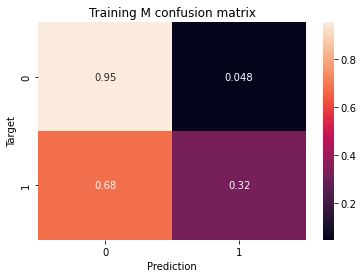

In [103]:
# accuracy on test and validation 
t_preds=pred_plot(train_pred,train_t,'Training M')

Accuracy  :81.68%


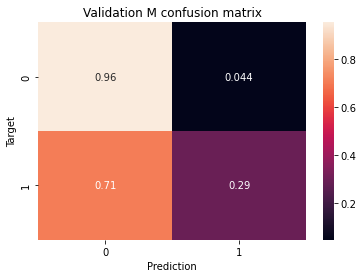

In [104]:
val_preds=pred_plot(val_pred,validation_t, "Validation M")

The accuracy of the model on train and validation set are above 80% , we should work more on hyperparemter tunning to improve the model accuracy.